# Capstone 3 - Data pre-processing

### Table of contents

* [Introduction](#intro)
    * [Import relevant libraries](#import)
    * [Retrieve variables](#retrieve-variables)
* [Preparing to pre-process the data](#prepare-preprocess)
    * [Define a function `identify_missing_values`](#missing-values)
    * [Define a function `knn_impute`](#knn-impute)
* [Imputing missing values](#impute)
    * [Summary data](#impute-summary)
    * [Lower grades achievement data](#impute-lg-achievement)
    * [High school achievement data](#impute-hs-achievement)
* [Identifying noise profiles with KMeans Clustering](#k-means-clustering)
    * [Silhouette score](#silhouette-score)
    * [Noise characteristics heatmap for each cluster](#noise-cluster-heatmap)
    * [Cluster visualization](#cluster-visualization)
    * [Feature importance](#feature-importance)
    * [Geographic distribution of clusters](#geographic-distribution-clusters)
* [Pre-modeling visualization & analysis](#pre-modeling)
    * [Achievement score](#pm-achievement-score)
        * [Lower grades](#pm-achievement-lg)
        * [High school](#pm-achievement-hs)
    * [English & Mathematics achievement scores](#e-m-achievement)
        * [Lower grades](#e-m-achievement-lg)
        * [High school](#e-m-achievement-hs)
    * [Pre-modeling conclusions](#pm-conclusions)
        * [Combining `ela_proficient_pct` and `math_proficient_pct` into one metric](#lg-metric-combo)
* [Modeling](#modeling)
    * [Prepare data for classification models](#prepare-data)
    * [Model training and evaluation](#model-training)
    * [Logistic Regression Model Analysis](#log-re-model-analysis)
* [Conclusion](#conclusion)
* [Creation of model metrics file](#model-metrics)

## Introduction <a name="intro"></a>

### Import relevant libraries <a name="import"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, classification_report, confusion_matrix, precision_recall_curve, roc_curve, auc
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from imblearn.over_sampling import SMOTE  # for handling class imbalance

import plotly.express as px

import folium
import branca.colormap as cm

### Retrieve variables <a name="retrieve-variables"></a>

In [2]:
# Retrieve original noise_data dataframe
%store -r noise_data

# Retrieve GeoPandas dataframes
%store -r districts_gdf 
%store -r schoolpoints_gdf

# Retrieve schools covered by sensor range
%store -r coverage_matrix

# Retrieve school demographic information
%store -r combined_summary_df

# Retrieve lower grades achievement information
%store -r combined_lg_achievement_df

# Retrieve high school achievement information
%store -r combined_hs_achievement_df

# # Retrieve combined achievement data
# %store -r coverage_combined_achievement_df
# %store -r non_coverage_combined_achievement_df

# # Retrieve merged dataset with all metrics
# %store -r merged_coverage_df

# Retrieve school lists
%store -r elem_middle_schools
%store -r high_schools
%store -r filtered_schools

In [3]:
# For machine learning model
# Retrieve school patterns
%store -r school_patterns_df

## Preparing to pre-process the data <a name="prepare-preprocess"></a>

To simplify our pre-processing stage, we will write a few functions.

### Define a function `identify_missing_values` <a name="missing-values"></a>
To start, we will define a function, `identify_missing_values`, that will help us isolate columns with missing values.

In [4]:
def identify_missing_values(df):
    # Isolate numerical variables
    numerical_variables = df.select_dtypes(exclude=['object', 'category', 'bool']).columns
    
    # Loop through numerical variables of summary dfs to find number of null values in each column
    # Also, create an empty list for adding any columns with missing values
    missing_numerical_variables = []
    for item in numerical_variables:
        missing_values = df[item].isnull().sum()
        if missing_values > 0:
            print(f"{item}: {missing_values}")
            missing_numerical_variables.append(item)
    
    return missing_numerical_variables

### Define a function `knn_impute` <a name="knn-impute"></a>

In [5]:
def knn_impute(df, n_neighbors=5):
    print(f"{'-'*80}\nMissing numerical variables before imputing:")
    missing_numerical_variables = identify_missing_values(df)
    print(f"{'-'*80}")
    missing_numerical_data = df[missing_numerical_variables]
    
    # Perform KNN imputation
    imputer = KNNImputer(n_neighbors=n_neighbors)
    numerical_data_imputed = imputer.fit_transform(missing_numerical_data)
    
    # Convert imputed data back to a dataframe
    numerical_data_imputed = pd.DataFrame(numerical_data_imputed, columns=missing_numerical_variables, 
                                          index=df.index)
    
    # Combine with original categorical columns
    df_imputed = df.copy()
    df_imputed[missing_numerical_variables] = numerical_data_imputed
    
    return df_imputed

## Imputing missing values <a name="impute"></a>

### Summary data (`combined_summary_df`) <a name="impute-summary"></a>

In [6]:
combined_summary_imputed = knn_impute(combined_summary_df)
combined_summary_imputed

--------------------------------------------------------------------------------
Missing numerical variables before imputing:
student_attendance_rate: 98
chronic_absence_pct: 108
teacher_attendance_rate: 705
--------------------------------------------------------------------------------


,DBN,school_name,enrollment,ell_pct,disability_pct,self_contained_pct,asian_pct,black_pct,hispanic_pct,white_pct,student_attendance_rate,chronic_absence_pct,teacher_attendance_rate,academic_year,coverage,grade_level
0,01M015,P.S. 015 Roberto Clemente,161,0.075,0.304,0.031,0.068,0.298,0.584,0.025,0.938000,0.215000,0.982000,2016-2017,False,lg
1,01M019,P.S. 019 Asher Levy,247,0.036,0.340,0.117,0.077,0.202,0.664,0.053,0.910000,0.324000,0.972000,2016-2017,False,lg
2,01M020,P.S. 020 Anna Silver,499,0.186,0.224,0.072,0.329,0.098,0.491,0.042,0.929000,0.256000,0.962000,2016-2017,False,lg
3,01M034,P.S. 034 Franklin D. Roosevelt,337,0.080,0.380,0.021,0.053,0.297,0.614,0.030,0.912000,0.305000,0.972000,2016-2017,False,lg
4,01M064,P.S. 064 Robert Simon,226,0.044,0.354,0.009,0.058,0.190,0.673,0.071,0.913000,0.346000,0.969000,2016-2017,False,lg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5299,24Q550,High School for Arts and Business,812,0.095,0.158,0.001,0.085,0.079,0.765,0.054,0.912000,0.249000,0.965000,2018-2019,True,hs
5300,28Q220,P.S. 220 Edward Mandel,670,0.224,0.113,0.016,0.330,0.076,0.200,0.357,0.944000,0.162000,0.955000,2018-2019,True,lg
5301,84M174,Success Academy Union Square (Manhattan 1),619,0.031,0.195,0.039,0.186,0.221,0.258,0.283,0.915104,0.267778,0.963933,2018-2019,True,lg
5302,84M202,Great Oaks Charter School,215,0.042,0.302,0.028,0.084,0.256,0.619,0.028,0.915104,0.267778,0.963933,2018-2019,True,lg


### Lower grades achievement data (`combined_lg_achievement_df`) <a name="impute-lg-achievement"></a>

In [7]:
combined_lg_achievement_imputed = knn_impute(combined_lg_achievement_df)
combined_lg_achievement_imputed

--------------------------------------------------------------------------------
Missing numerical variables before imputing:
achievement_score: 252
ela_proficient_pct: 12
ela_avg_proficiency: 12
ela_lowest_third_proficiency: 12
math_proficient_pct: 17
math_avg_proficiency: 17
math_lowest_third_proficiency: 17
attendance_90_plus_pct: 94
--------------------------------------------------------------------------------


,DBN,school_name,school_type,achievement_score,ela_proficient_pct,ela_avg_proficiency,ela_lowest_third_proficiency,math_proficient_pct,math_avg_proficiency,math_lowest_third_proficiency,attendance_90_plus_pct,ela_proficient_n,math_proficient_n,ela_lowest_third_n,math_lowest_third_n,academic_year,coverage,grade_level
0,01M015,P.S. 015 Roberto Clemente,Elementary,4.920,0.338,2.67,2.67,0.429,2.79,2.20,0.7850,68,70,19,18,2016-2017,False,lg
1,01M019,P.S. 019 Asher Levy,Elementary,4.230,0.486,2.85,2.35,0.481,3.01,2.24,0.6760,109,106,24,23,2016-2017,False,lg
2,01M020,P.S. 020 Anna Silver,Elementary,2.210,0.289,2.52,1.92,0.311,2.52,1.77,0.7440,218,219,44,45,2016-2017,False,lg
3,01M034,P.S. 034 Franklin D. Roosevelt,K-8,2.890,0.254,2.52,2.04,0.177,2.34,1.83,0.6950,240,232,74,68,2016-2017,False,lg
4,01M064,P.S. 064 Robert Simon,Elementary,3.770,0.286,2.56,2.08,0.321,2.54,1.90,0.6540,105,106,27,27,2016-2017,False,lg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3836,24Q014,P.S. 014 Fairview,Elementary,2.850,0.288,2.52,1.94,0.324,2.57,1.82,0.8170,877,905,192,202,2018-2019,True,lg
3837,28Q220,P.S. 220 Edward Mandel,Elementary,2.050,0.468,2.89,1.99,0.480,2.91,1.93,0.8380,316,321,69,70,2018-2019,True,lg
3838,84M174,Success Academy Union Square (Manhattan 1),Elementary,4.860,0.925,3.75,3.48,0.977,4.14,3.92,0.9110,305,304,82,80,2018-2019,True,lg
3839,84M202,Great Oaks Charter School,Middle,3.658,0.261,2.55,2.11,0.311,2.53,1.90,0.6674,207,206,71,67,2018-2019,True,lg


### High school achievement data (`combined_hs_achievement_df`) <a name="impute-hs-achievement"></a>

In [8]:
combined_hs_achievement_imputed = knn_impute(combined_hs_achievement_df)
combined_hs_achievement_imputed

--------------------------------------------------------------------------------
Missing numerical variables before imputing:
achievement_score: 93
grad_rate_4yr: 73
grad_rate_6yr: 206
regents_english: 28
regents_algebra: 91
regents_living_env: 137
regents_global: 151
regents_us_history: 166
college_prep_index: 74
college_ready_4yr: 74
college_ready_6yr: 206
postsec_enroll_6mo: 129
postsec_enroll_18mo: 206
credits_yr1: 35
credits_yr2: 53
credits_yr3: 66
attendance_90_plus_pct: 14
--------------------------------------------------------------------------------


,DBN,school_name,school_type,achievement_score,grad_rate_4yr,grad_rate_6yr,regents_english,regents_algebra,regents_living_env,regents_global,...,credits_yr1,credits_yr2,credits_yr3,grad_rate_n,regents_english_n,college_ready_n,attendance_90_plus_pct,academic_year,coverage,grade_level
0,01M292,Orchard Collegiate Academy,High School,3.72,0.658,0.708,76.5,67.1,65.60,59.4,...,0.868,0.824,0.879,38,43,38,0.552,2016-2017,False,hs
1,01M448,University Neighborhood High School,High School,4.45,0.897,0.855,73.1,72.5,72.60,71.8,...,0.945,0.941,0.903,78,146,78,0.756,2016-2017,False,hs
2,01M509,Marta Valle High School,High School,2.89,0.741,0.604,67.4,59.4,58.60,56.7,...,0.862,0.882,0.760,58,90,58,0.369,2016-2017,False,hs
3,01M539,"New Explorations into Science, Technology and ...",High School,4.23,0.973,0.992,88.1,78.2,80.90,90.6,...,0.913,0.986,0.962,183,62,183,0.898,2016-2017,False,hs
4,01M696,Bard High School Early College,High School,4.41,0.991,0.987,89.4,79.6,75.62,86.5,...,0.950,0.967,0.942,113,151,113,0.870,2016-2017,False,hs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,13K674,"City Polytechnic High School of Engineering, A...",High School,2.52,0.782,0.909,68.2,58.9,64.50,78.0,...,0.835,0.747,0.702,110,112,110,0.643,2018-2019,True,hs
1459,14K610,Automotive High School,High School,2.90,0.767,0.650,65.3,59.2,65.70,60.8,...,0.760,0.713,0.573,116,132,116,0.459,2018-2019,True,hs
1460,15K592,Khalil Gibran International Academy,High School,2.93,0.767,0.706,61.3,57.1,57.40,58.2,...,0.797,0.712,0.653,73,96,73,0.538,2018-2019,True,hs
1461,15K656,Brooklyn High School of the Arts,High School,2.75,0.881,0.934,74.5,63.9,66.70,64.2,...,0.866,0.827,0.845,185,349,185,0.671,2018-2019,True,hs


---

## Identifying noise profiles with KMeans clustering <a name="k-means-clustering"></a>
Before examining relationships between noise and achievement metrics, we will first explore whether schools naturally group together based on their noise exposure patterns. Using K-Means clustering, an unsupervised learning technique, we can identify distinct patterns of environmental noise that characterize different school environments. This analysis will provide valuable context about the types of noise environments that exist across schools, potentially revealing patterns that might not be apparent when looking at individual noise types in isolation. Understanding these natural groupings can inform our subsequent analysis of how different noise profiles might relate to student achievement.

In [9]:
# Suppress any distracting warning messages
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='sklearn.cluster._kmeans')

### Silhouette score <a name="silhouette-score"></a>

We will plot a line graph of the Silhouette Score vs. Number of Clusters side-by-side with the elbow curve.

In [10]:
# Create presence_cols
presence_cols = [col for col in noise_data.columns if col.endswith('_presence')]

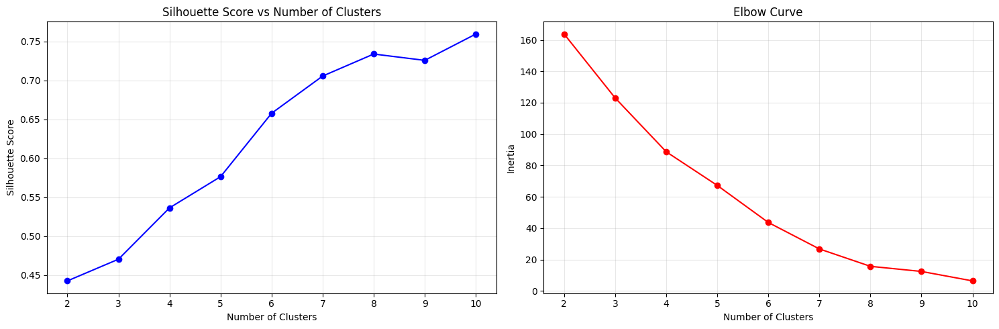

In [11]:
# Prepare the data
noise_profiles = school_patterns_df.groupby('DBN')[presence_cols].mean().reset_index()
scaler = StandardScaler()
noise_scaled = scaler.fit_transform(noise_profiles[presence_cols])

# Try range of 10 clusters
n_clusters_range = range(2, 11)
silhouette_scores = []
inertias = []  # For elbow method

for n_clusters in n_clusters_range:
    # Fit KMeans and get silhouette score
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(noise_scaled)
    silhouette_avg = silhouette_score(noise_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    # Get inertia (within-cluster sum of squares)
    inertias.append(kmeans.inertia_)

# Create subplot for both metrics
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot silhouette scores
ax1.plot(n_clusters_range, silhouette_scores, 'bo-')
ax1.set_xlabel('Number of Clusters')
ax1.set_ylabel('Silhouette Score')
ax1.set_title('Silhouette Score vs Number of Clusters')
ax1.grid(True, alpha=0.3)

# Plot elbow curve
ax2.plot(n_clusters_range, inertias, 'ro-')
ax2.set_xlabel('Number of Clusters')
ax2.set_ylabel('Inertia')
ax2.set_title('Elbow Curve')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Based on our elbow curve graph, there is no distinctly identifiable "elbow." At $k=8$, however, the silhouette score begins to plateau.

In [12]:
# Print exact values of silhouette scores
print("Silhouette scores for each number of clusters:")
for n, score in zip(n_clusters_range, silhouette_scores):
    print(f"n_clusters={n}: {score:.3f}")

Silhouette scores for each number of clusters:
n_clusters=2: 0.443
n_clusters=3: 0.470
n_clusters=4: 0.536
n_clusters=5: 0.576
n_clusters=6: 0.658
n_clusters=7: 0.705
n_clusters=8: 0.734
n_clusters=9: 0.726
n_clusters=10: 0.759


While the silhouette score increases for each increasing value of $k$, 10, our maximum value, may not necessarily be the best possible value of $k$. To identify the best possible value of $k$, let's take a closer look at how our groups of schools are clustered:

In [13]:
# Print cluster sizes for each option
for n in n_clusters_range:
    kmeans = KMeans(n_clusters=n, random_state=42)
    labels = kmeans.fit_predict(noise_scaled)
    print(f"Cluster sizes for n_clusters={n}:")
    sizes = pd.Series(labels).value_counts().sort_index()
    print(sizes)

total_schools = len(noise_profiles)
print(f"\nTotal number of schools: {total_schools}")

Cluster sizes for n_clusters=2:
0    15
1    24
Name: count, dtype: int64
Cluster sizes for n_clusters=3:
0    13
1     8
2    18
Name: count, dtype: int64
Cluster sizes for n_clusters=4:
0    13
1     8
2    16
3     2
Name: count, dtype: int64
Cluster sizes for n_clusters=5:
0     9
1     7
2    12
3     2
4     9
Name: count, dtype: int64
Cluster sizes for n_clusters=6:
0    7
1    7
2    9
3    2
4    9
5    5
Name: count, dtype: int64
Cluster sizes for n_clusters=7:
0    7
1    7
2    8
3    2
4    9
5    3
6    3
Name: count, dtype: int64
Cluster sizes for n_clusters=8:
0    7
1    8
2    7
3    2
4    1
5    2
6    3
7    9
Name: count, dtype: int64
Cluster sizes for n_clusters=9:
0    7
1    3
2    7
3    2
4    1
5    2
6    3
7    8
8    6
Name: count, dtype: int64
Cluster sizes for n_clusters=10:
0    7
1    3
2    7
3    2
4    1
5    2
6    3
7    7
8    6
9    1
Name: count, dtype: int64

Total number of schools: 39


Note that we begin to see our first single-school clusters at $k=8$. This is not desirable, so we will be choosing a $k$ such that $k < 8$.

Cluster sizes for $k=7$ are fairly balanced; however, there are three smaller groups, each containing 2 to 3 schools. At $k = 6$, we see fairly balanced clusters of schools. There is one group of 2, and all other clusters contain between 5 and 9 schools.

Because it is the most balanced, and since it has a strong silhouette score at 0.658, we will choose $k=6$.

### Noise characteristics heatmap for each cluster <a name="noise-cluster-heatmap"></a>

The scores on this heatmap represent the percentage of noise files associated with each school where the presence of a specific noise was identified.

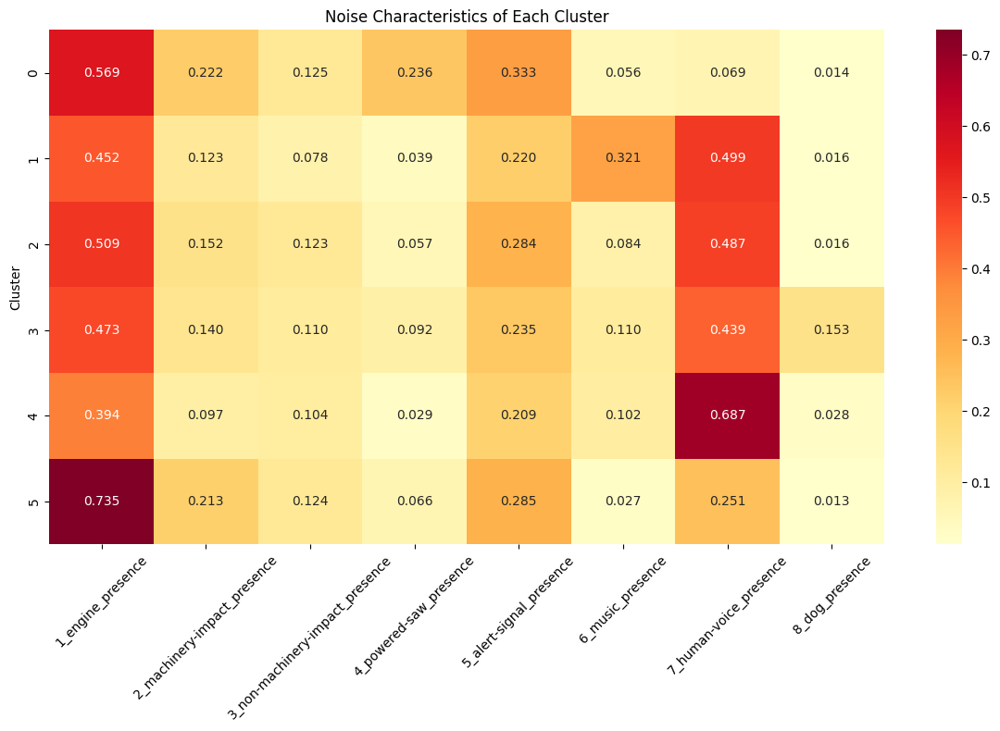

In [14]:
optimal_clusters = 6

# Perform final clustering with optimal number
kmeans_final = KMeans(n_clusters=optimal_clusters, random_state=42)
noise_profiles['Cluster'] = kmeans_final.fit_predict(noise_scaled)

# Analyze cluster characteristics
# Create heatmap of cluster centers
plt.figure(figsize=(12, 8))
cluster_centers = pd.DataFrame(
    scaler.inverse_transform(kmeans_final.cluster_centers_),
    columns=presence_cols
)
sns.heatmap(cluster_centers, annot=True, cmap='YlOrRd', fmt='.3f')
plt.title('Noise Characteristics of Each Cluster')
plt.ylabel('Cluster')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Observations:**
- Engine noise is consistently present throughout our clusters. Notably, cluser 4 has the lowest presence of engine noise, while cluster 5 has the highest.
- Cluster 4 has the highest human voice presence.
- Cluster 1 has the highest music presence.

#### Cluster sizes

In [15]:
# Print cluster sizes
print("Number of schools in each cluster:")
print(noise_profiles['Cluster'].value_counts())

Number of schools in each cluster:
Cluster
2    9
4    9
0    7
1    7
5    5
3    2
Name: count, dtype: int64


### Cluster visualization <a name="cluster-visualization"></a>
To confirm the grouping of our clusters, we will visualize them using PCA.

#### 2D visualization

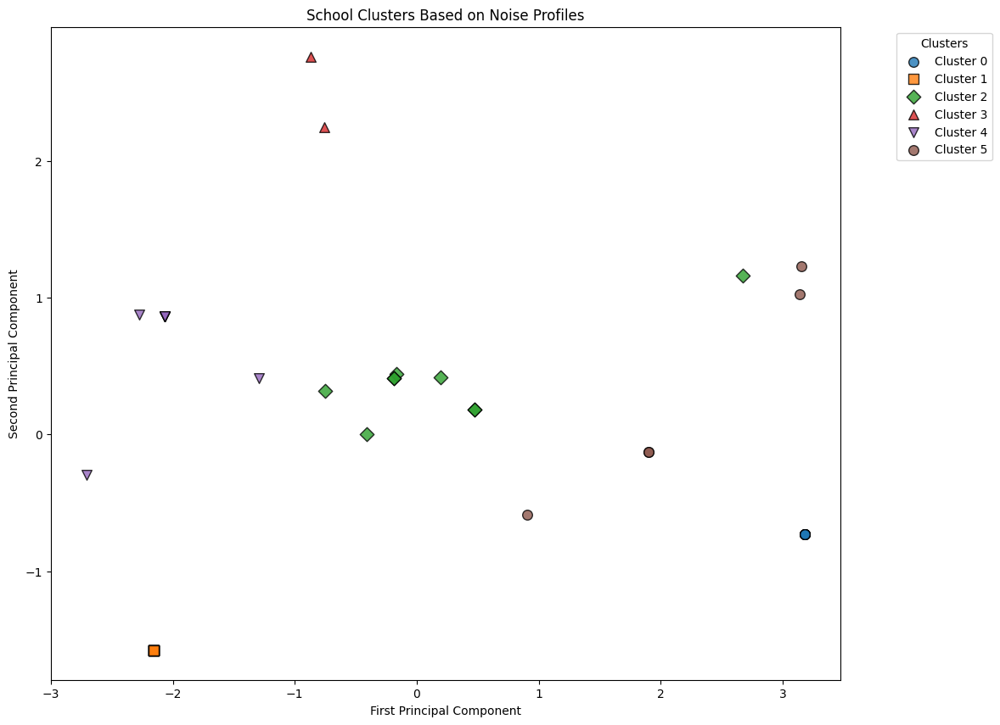

In [16]:
# Create visualization of clusters
# Use PCA to visualize in 2D
pca = PCA(n_components=2)
noise_pca = pca.fit_transform(noise_scaled)

# Plot clusters
plt.figure(figsize=(12, 10))

markers = ['o', 's', 'D', '^', 'v'] # Define marker types

for cluster in np.unique(noise_profiles['Cluster']):
    mask = noise_profiles['Cluster'] == cluster
    plt.scatter(noise_pca[mask, 0], noise_pca[mask, 1], 
                label=f'Cluster {cluster}', 
                marker=markers[cluster % len(markers)], 
                edgecolor='k', s=70, alpha=0.8)

plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('School Clusters Based on Noise Profiles')
plt.legend(title="Clusters", loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

Clusters 3 clearly occupies a distinct region, while there exists some overlap between clusters 4 and 2, 2 and 5, and 5 and 0.

We will examine this graph in 3D using `plotly` to better determine whether these distinctions are appropriate.

#### 3D visualization

In [17]:
# Use PCA to reduce to 3D for visualization
pca_3d = PCA(n_components=3)
noise_pca_3d = pca_3d.fit_transform(noise_scaled)

# Create a DataFrame for easier handling
pca_df = pd.DataFrame({
    'PC1': noise_pca_3d[:, 0],
    'PC2': noise_pca_3d[:, 1],
    'PC3': noise_pca_3d[:, 2],
    'Cluster': noise_profiles['Cluster']
})

# Generate the interactive 3D scatter plot
fig = px.scatter_3d(
    pca_df, 
    x='PC1', 
    y='PC2', 
    z='PC3', 
    color='Cluster', 
    title='3D Interactive PCA of School Clusters',
    labels={'PC1': 'Principal Component 1', 
            'PC2': 'Principal Component 2', 
            'PC3': 'Principal Component 3'},
    color_discrete_sequence=px.colors.qualitative.Set1  # Use a qualitative color scheme
)

# Customize layout for better appearance
fig.update_traces(marker=dict(size=5, opacity=0.8))  # Adjust point size and transparency
fig.update_layout(scene=dict(
    xaxis_title='Principal Component 1',
    yaxis_title='Principal Component 2',
    zaxis_title='Principal Component 3'
))

# Show the interactive plot
fig.show()

Although some overlap is apparent between clusters 2 and 5, suggesting potential similarities or noise within the data, the remaining five clusters are well-separated and distinct.

### Feature importance <a name="feature-importance"></a>

In [18]:
# Show feature importance
print("Feature importance (PCA components):")
feature_importance = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=presence_cols
)
print(feature_importance)

Feature importance (PCA components):
                                      PC1       PC2
1_engine_presence                0.374221  0.025222
2_machinery-impact_presence      0.437334 -0.083197
3_non-machinery-impact_presence  0.331954  0.477936
4_powered-saw_presence           0.358770 -0.225246
5_alert-signal_presence          0.411877 -0.078699
6_music_presence                -0.296244 -0.531409
7_human-voice_presence          -0.403404  0.294488
8_dog_presence                  -0.098235  0.581354


#### First Principal Component (PC1)
**Strong positive correlations:**
- Machinery-impact (0.437)
- Alert-signal (0.412)
- Engine (0.374)
- Powered saw (0.359)

**Strong negative correlations:**
- Human voice (-0.403)
- Music (-0.296)

PC1 seems to separate mechanical noise from human-generated noise.

#### Second Principal Component (PC2):
**Strong positive correlations:**
- Dog (0.581)
- Non-machinery impact (0.478)
- Human voice (0.294)

**Strong negative correlations:**
- Music (-0.531)
- Powered saw (-0.225)

PC2 seems to separate uncontrolled environmental noise from intentional noise.

In [19]:
schoolpoints_gdf_coverage = schoolpoints_gdf[schoolpoints_gdf['ATS'].isin(filtered_schools)]

# First, rerun the clustering with 6 clusters
noise_profiles = school_patterns_df.groupby('DBN')[presence_cols].mean().reset_index()
scaler = StandardScaler()
noise_scaled = scaler.fit_transform(noise_profiles[presence_cols])
kmeans = KMeans(n_clusters=6, random_state=42)
noise_profiles['Cluster'] = kmeans.fit_predict(noise_scaled)

# Get the most recent academic year for each school
latest_lg = combined_lg_achievement_imputed.sort_values('academic_year').groupby('DBN').last().reset_index()
latest_hs = combined_hs_achievement_imputed.sort_values('academic_year').groupby('DBN').last().reset_index()

# Schools in each cluster with their characteristics
# Merge with school information and achievement data
cluster_info = noise_profiles.merge(
    pd.concat([
        latest_lg[['DBN', 'school_name', 'achievement_score', 'grade_level']],
        latest_hs[['DBN', 'school_name', 'achievement_score', 'grade_level']]
    ]),
    on='DBN'
).merge(
    combined_summary_df.sort_values('academic_year').groupby('DBN').last().reset_index()[
        ['DBN', 'enrollment', 'ell_pct', 'disability_pct', 
         'asian_pct', 'black_pct', 'hispanic_pct', 'white_pct']
    ],
    on='DBN'
)

# Print detailed cluster information
print("Detailed Cluster Information:")
for cluster in range(6):
    cluster_schools = cluster_info[cluster_info['Cluster'] == cluster]
    print(f"\nCluster {cluster} Schools:")
    print(f"Number of schools: {len(cluster_schools)}")
    print("\nSchools in this cluster:")
    for _, school in cluster_schools.iterrows():
        print(f"DBN: {school['DBN']}, Name: {school['school_name']}")
    print("\nCluster Characteristics:")
    print("Average Achievement Score:", cluster_schools['achievement_score'].mean())
    print("Grade Levels:", cluster_schools['grade_level'].value_counts().to_dict())
    print("\nDemographic Averages:")
    for col in ['enrollment', 'ell_pct', 'disability_pct', 'asian_pct', 
                'black_pct', 'hispanic_pct', 'white_pct']:
        print(f"{col}: {cluster_schools[col].mean():.2f}")

# Print total number of unique schools
print("\nVerification:")
print(f"Total unique schools: {len(cluster_info)}")
print(f"Schools per cluster:")
print(cluster_info['Cluster'].value_counts().sort_index())

Detailed Cluster Information:

Cluster 0 Schools:
Number of schools: 7

Schools in this cluster:
DBN: 02M135, Name: The Urban Assembly School for Emergency Management
DBN: 02M280, Name: Manhattan Early College School for Advertising
DBN: 02M282, Name: Urban Assembly Maker Academy
DBN: 02M343, Name: The Peck Slip School
DBN: 02M397, Name: Spruce Street School
DBN: 02M418, Name: Millennium High School
DBN: 02M520, Name: Murry Bergtraum High School for Business Careers

Cluster Characteristics:
Average Achievement Score: 3.3728571428571428
Grade Levels: {'hs': 5, 'lg': 2}

Demographic Averages:
enrollment: 414.00
ell_pct: 0.04
disability_pct: 0.19
asian_pct: 0.16
black_pct: 0.22
hispanic_pct: 0.33
white_pct: 0.23

Cluster 1 Schools:
Number of schools: 8

Schools in this cluster:
DBN: 13K350, Name: Urban Assembly School for Music and Art
DBN: 13K419, Name: Science Skills Center High School for Science, Tec
DBN: 13K439, Name: Brooklyn International High School
DBN: 13K483, Name: The Urban A

### Geographic distribution of clusters <a name="geographic-distribution-clusters"></a>
Let's create a map in which we can visualize the geographic distribution of clusters.

In [20]:
# Create map with clusters
center_lat = schoolpoints_gdf_coverage.geometry.y.mean()
center_lon = schoolpoints_gdf_coverage.geometry.x.mean()
m = folium.Map(location=[center_lat, center_lon], 
               tiles="Cartodb Positron", 
               zoom_start=11)

# Add district boundaries
districts_layer = folium.FeatureGroup(name='School Districts')
folium.GeoJson(
    districts_gdf,
    style_function=lambda x: {
        'fillColor': 'gray',
        'fillOpacity': 0.1,
        'color': 'black',
        'weight': 1
    },
    tooltip=folium.GeoJsonTooltip(fields=['school_dis'])
).add_to(districts_layer)
districts_layer.add_to(m)

# Add clusters to map
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred']
cluster_map_data = schoolpoints_gdf_coverage.copy()
cluster_map_data = cluster_map_data.rename(columns={'ATS': 'DBN'})
cluster_map_data = cluster_map_data.merge(noise_profiles[['DBN', 'Cluster']], on='DBN')

for idx, row in cluster_map_data.iterrows():
    popup_content = f"""
    <b>School:</b> {row['Name']}<br>
    <b>DBN:</b> {row['DBN']}<br>
    <b>Cluster:</b> {row['Cluster']}
    """
    
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=8,
        color=colors[row['Cluster']],
        fill=True,
        popup=folium.Popup(popup_content, max_width=300),
        tooltip=row['Name']
    ).add_to(m)

# Add legend
legend_html = """
<div style="position: fixed; 
    bottom: 50px; right: 50px; width: 150px; height: 180px; 
    border:2px solid grey; z-index:9999; background-color:white;
    opacity:0.8;
    padding: 10px;
    font-size: 12px;
    line-height: 1.2;">
    <p style="margin-top: 0; margin-bottom: 5px;"><b>Clusters</b></p>
"""
for i, color in enumerate(colors):
    legend_html += f'<p style="margin: 2px 0;"><span style="color:{color};">●</span> Cluster {i}</p>'
legend_html += '</div>'
m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
display(m)

Each cluster is centered around a distinct geographical area, with some overlap between clusters 2 and 3. Notably, clusters 4 and 5 each include one outlier school located far from their respective geographical centers.

**Note:** I will also be creating a non-interactive version of this map below so that I can save the figure as an image.

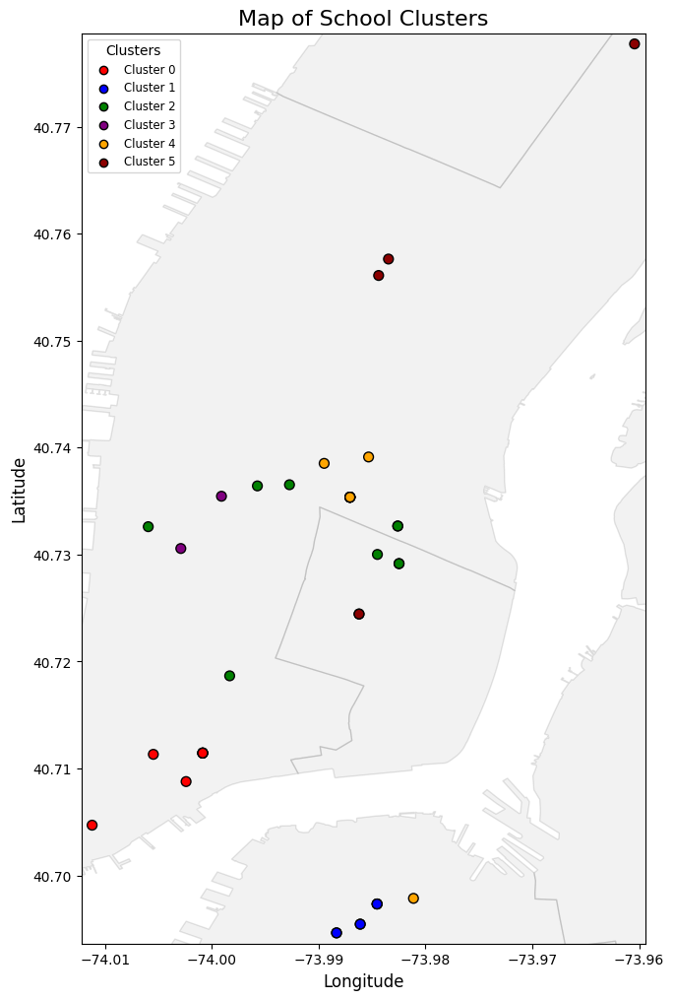

In [21]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Calculate bounds of the points
x_min, y_min, x_max, y_max = schoolpoints_gdf_coverage.total_bounds

# Merge cluster data into school GeoDataFrame
schoolpoints_gdf_coverage = schoolpoints_gdf_coverage.rename(columns={'ATS': 'DBN'})
cluster_data = noise_profiles[['DBN', 'Cluster']]
schoolpoints_gdf_coverage = schoolpoints_gdf_coverage.merge(cluster_data, on='DBN')

# Define colors for clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred']
cmap = ListedColormap(colors[:schoolpoints_gdf_coverage['Cluster'].nunique()])

# Create plot
fig, ax = plt.subplots(figsize=(12, 12))
districts_gdf.plot(ax=ax, color='gray', edgecolor='black', alpha=0.1, linewidth=1, zorder=1)

# Plot schools with cluster colors
schoolpoints_gdf_coverage.plot(
    ax=ax,
    column='Cluster',
    cmap=cmap,
    markersize=50,
    edgecolor='black',
    zorder=2,
    legend=False
)

# Add legend
for cluster, color in enumerate(colors[:schoolpoints_gdf_coverage['Cluster'].nunique()]):
    ax.scatter([], [], color=color, label=f'Cluster {cluster}', edgecolor='black')

ax.legend(title="Clusters", loc='upper left', fontsize='small', title_fontsize='medium')

# Add padding to zoom in (reduce map extent)
padding = 0.001  # Adjust as needed
ax.set_xlim(x_min - padding, x_max + padding)
ax.set_ylim(y_min - padding, y_max + padding)

# Customize the map
ax.set_title("Map of School Clusters", fontsize=16)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)
ax.set_aspect('equal')

# Save the figure to a file
plt.savefig("./Figures/school_clusters.png", dpi=300, bbox_inches='tight')

plt.show()

---

## Pre-modeling visualization & analysis <a name="pre-modeling"></a>
Before selecting a model, it is crucial for us to understand the relationships between our feature variables &mdash; noise types &mdash; and our potential target variables. Target variables we will consider are `achievement_score`, `ela_proficient_pct` and `math_proficient_pct` for lower grades, and `regents_english` and `regents_algebra` for high schools.

Previous data analysis has revealed that lower grades and high school have varying relationships with environmental noise, where lower grades seem to be more sensitive to the presence of environmental noise in general. For this reason, we will look at lower grades and high school separately, starting with lower grades.

### Achievement score <a name="pm-achievement-score"></a>

In [22]:
# Look at distribution of achievement score for lower grades
print("Lower Grades Achievement Score:")
print(combined_lg_achievement_imputed['achievement_score'].describe())

# Look at distribution of achievement score for high school
print("\nHigh School Achievement Score:")
print(combined_lg_achievement_imputed['achievement_score'].describe())

Lower Grades Achievement Score:
count    3841.000000
mean        3.367477
std         0.752855
min         1.330000
25%         2.800000
50%         3.380000
75%         3.920000
max         4.990000
Name: achievement_score, dtype: float64

High School Achievement Score:
count    3841.000000
mean        3.367477
std         0.752855
min         1.330000
25%         2.800000
50%         3.380000
75%         3.920000
max         4.990000
Name: achievement_score, dtype: float64


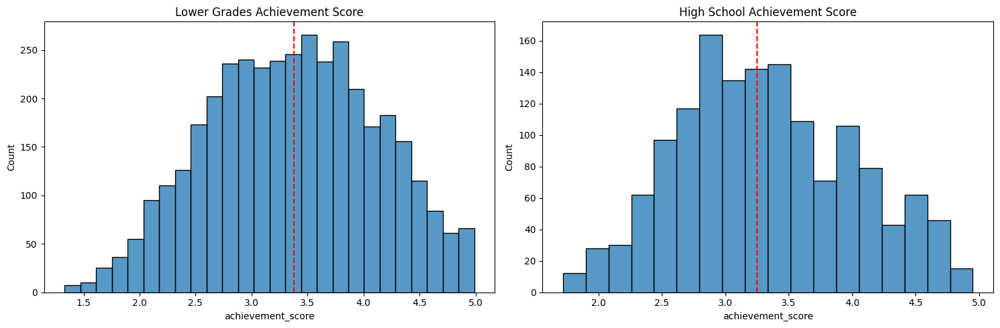

In [23]:
# Visualize distributions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Lower Grades
sns.histplot(data=combined_lg_achievement_imputed, x='achievement_score', ax=ax1)
ax1.axvline(combined_lg_achievement_imputed['achievement_score'].median(), color='r', linestyle='--')
ax1.set_title('Lower Grades Achievement Score')

# High School
sns.histplot(data=combined_hs_achievement_imputed, x='achievement_score', ax=ax2)
ax2.axvline(combined_hs_achievement_imputed['achievement_score'].median(), color='r', linestyle='--')
ax2.set_title('High School Achievement Score')

plt.tight_layout()
plt.show()

Achievement score distributions for both lower grades and high school are roughly normal.

In [24]:
# Function to create plots for a given dataset
def plot_noise_achievement(data, title, num_cols=2):
    num_noise_types = len(presence_cols)
    num_rows = (num_noise_types + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4*num_rows))
    axes = axes.ravel()
    
    for idx, noise_type in enumerate(presence_cols):
        # Create scatter plot
        sns.scatterplot(data=data, 
                       x=noise_type, 
                       y='achievement_score',
                       ax=axes[idx],
                       alpha=0.6)
        
        # Add trend line
        sns.regplot(data=data,
                   x=noise_type,
                   y='achievement_score',
                   scatter=False,
                   color='red',
                   ax=axes[idx])
        
        axes[idx].set_title(f'{noise_type.replace("_presence", "")}')
        axes[idx].set_xlabel('Number of Occurrences')
        axes[idx].set_ylabel('Achievement Score')
    
    # Remove any empty subplots
    if len(presence_cols) < len(axes):
        for idx in range(len(presence_cols), len(axes)):
            fig.delaxes(axes[idx])
    
    plt.suptitle(title, y=1.02, size=16)
    plt.tight_layout()
    plt.show()
    
    # Print correlations for this grade level
    correlations = data[presence_cols + ['achievement_score']].corr()['achievement_score']
    print(f"\nCorrelations for {title}:")
    print(correlations.sort_values(ascending=False))
    
    # Print summary statistics
    print(f"\nSummary Statistics for {title}:")
    print(data[presence_cols].describe())

In [25]:
# Get noise counts by school and academic year
noise_counts = school_patterns_df.groupby(['DBN', 'academic_year'])[presence_cols].sum().reset_index()

#### Lower grades analysis <a name="pm-achievement-lg"></a>

In [26]:
lg_data = noise_counts.merge(
    combined_lg_achievement_imputed[['DBN', 'school_name', 'achievement_score', 'academic_year']],
    on=['DBN', 'academic_year']
)

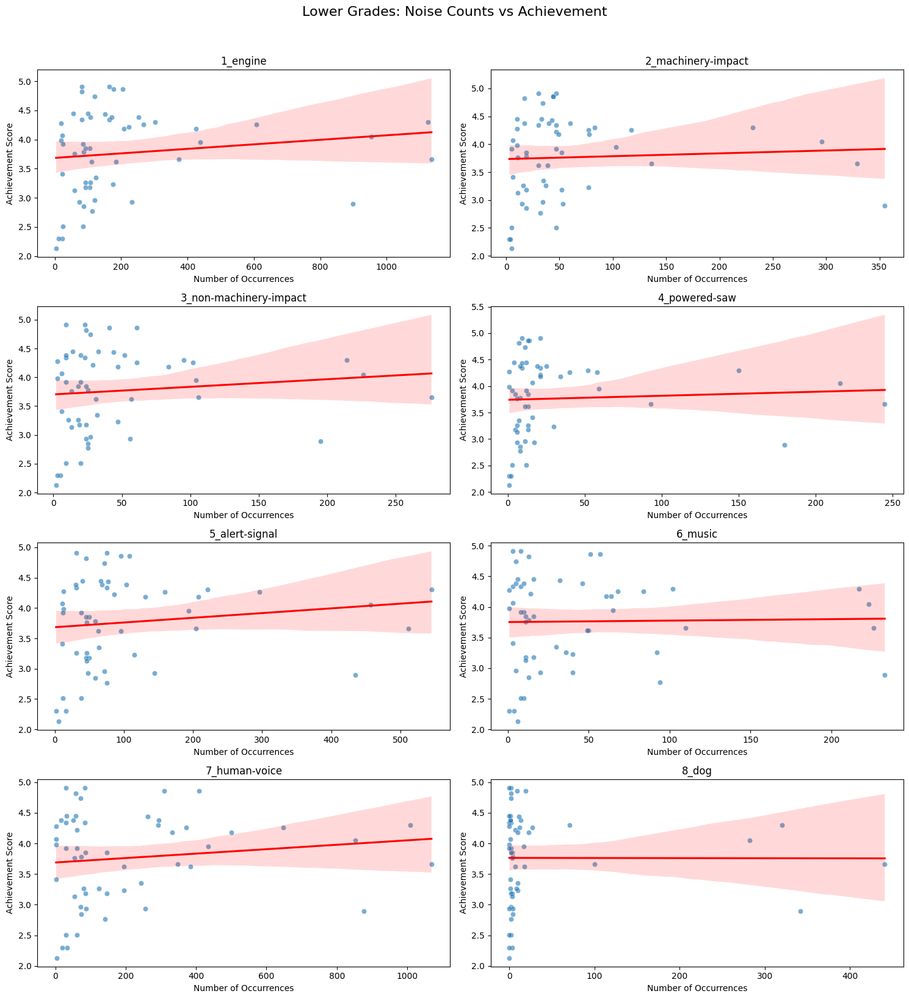


Correlations for Lower Grades: Noise Counts vs Achievement:
achievement_score                  1.000000
1_engine_presence                  0.137278
5_alert-signal_presence            0.130931
7_human-voice_presence             0.126046
3_non-machinery-impact_presence    0.104370
4_powered-saw_presence             0.052753
2_machinery-impact_presence        0.052663
6_music_presence                   0.018992
8_dog_presence                    -0.002259
Name: achievement_score, dtype: float64

Summary Statistics for Lower Grades: Noise Counts vs Achievement:
       1_engine_presence  2_machinery-impact_presence  \
count          55.000000                    55.000000   
mean          204.400000                    56.636364   
std           261.624526                    76.192583   
min             4.000000                     3.000000   
25%            81.000000                    16.500000   
50%           108.000000                    35.000000   
75%           207.000000             

In [27]:
plot_noise_achievement(lg_data, "Lower Grades: Noise Counts vs Achievement")

Our graphs indicate that there are only weak linear relationships between `achievement_score` and the number of recorded occurrences of a sound in lower grades.

While most noise types show slightly positive correlations (with engine noise, alert signals, and human voices showing the strongest at around 0.13), dog sounds show a negligible negative correlation (-0.002). These predominantly positive but weak correlations are somewhat counterintuitive and could indicate confounding variables, such as school location or resources available in more urban environments where certain noise types are more prevalent.

#### High school analysis <a name="pm-achievement-hs"></a>

In [28]:
hs_data = noise_counts.merge(
    combined_hs_achievement_imputed[['DBN', 'school_name', 'achievement_score', 'academic_year']],
    on=['DBN', 'academic_year']
)

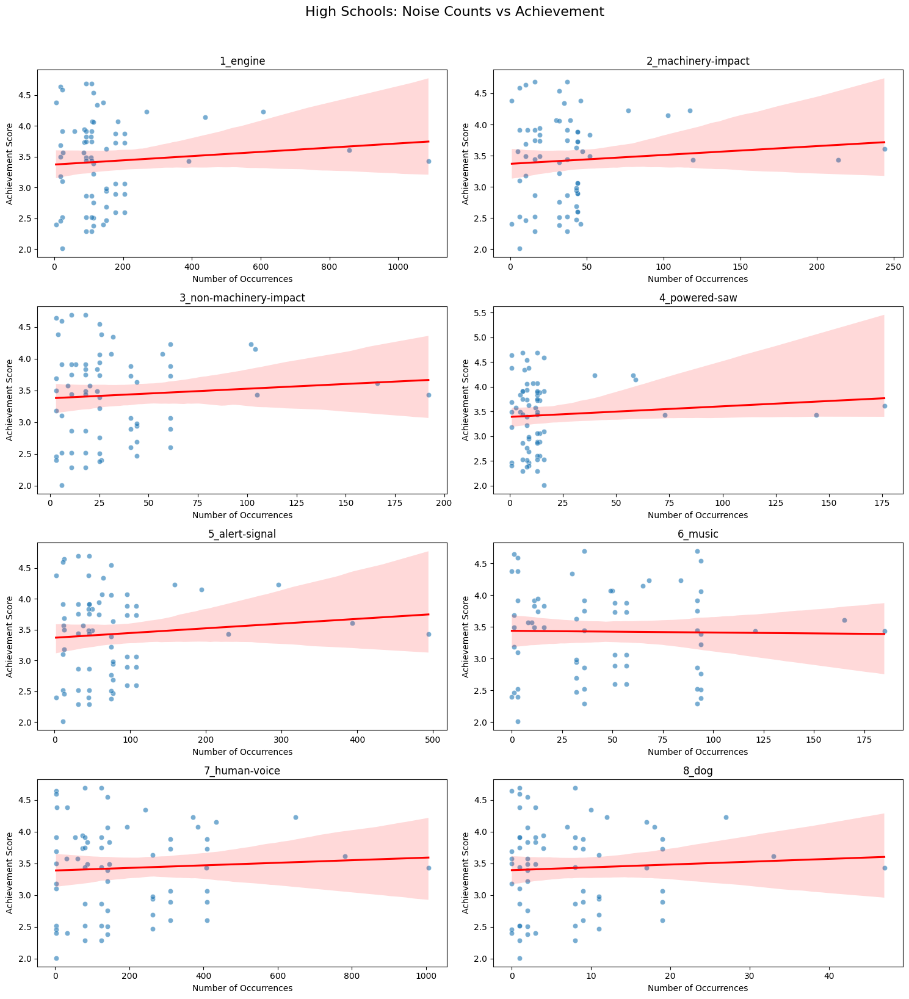


Correlations for High Schools: Noise Counts vs Achievement:
achievement_score                  1.000000
5_alert-signal_presence            0.090248
4_powered-saw_presence             0.086333
1_engine_presence                  0.085917
2_machinery-impact_presence        0.082620
3_non-machinery-impact_presence    0.074625
7_human-voice_presence             0.055184
8_dog_presence                     0.054506
6_music_presence                  -0.015777
Name: achievement_score, dtype: float64

Summary Statistics for High Schools: Noise Counts vs Achievement:
       1_engine_presence  2_machinery-impact_presence  \
count          68.000000                    68.000000   
mean          149.647059                    38.897059   
std           175.774683                    40.840476   
min             5.000000                     1.000000   
25%            90.750000                    16.000000   
50%           108.000000                    36.000000   
75%           158.500000             

In [29]:
plot_noise_achievement(hs_data, "High Schools: Noise Counts vs Achievement")

Analysis of high school data shows very weak linear relationships between `achievement_score` and noise occurrences. All correlations are below 0.10, with alert signals showing the strongest correlation (0.090) followed closely by powered saw noise (0.086) and engine noise (0.086). Unlike most noise types which show slight positive correlations, music shows a minor negative correlation (-0.016) with achievement scores. The consistently weak correlations suggest that the frequency of recorded noise events has minimal direct linear relationship with high school achievement scores, though underlying patterns may be obscured by confounding variables such as school location or resources.

### English and Mathematics achievement metrics <a name="e-m-achievement"></a>

#### Lower grades <a name="e-m-achievement-lg"></a>

In [30]:
# Look at distribution of achievement metrics for lower grades
print("Lower Grades Metrics Distribution:")
print("\nELA Proficiency:")
print(combined_lg_achievement_imputed['ela_proficient_pct'].describe())
print("\nMath Proficiency:")
print(combined_lg_achievement_imputed['math_proficient_pct'].describe())

Lower Grades Metrics Distribution:

ELA Proficiency:
count    3841.000000
mean        0.433398
std         0.204447
min         0.000000
25%         0.271000
50%         0.401000
75%         0.574000
max         1.000000
Name: ela_proficient_pct, dtype: float64

Math Proficiency:
count    3841.000000
mean        0.414193
std         0.236729
min         0.000000
25%         0.221000
50%         0.367000
75%         0.587000
max         1.000000
Name: math_proficient_pct, dtype: float64


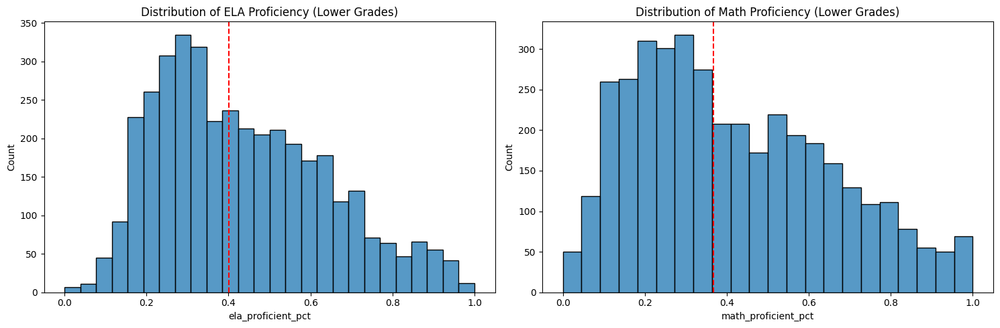

In [31]:
# Visualize distributions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Lower Grades
sns.histplot(data=combined_lg_achievement_imputed, x='ela_proficient_pct', ax=ax1)
ax1.axvline(combined_lg_achievement_imputed['ela_proficient_pct'].median(), color='r', linestyle='--')
ax1.set_title('Distribution of ELA Proficiency (Lower Grades)')

sns.histplot(data=combined_lg_achievement_imputed, x='math_proficient_pct', ax=ax2)
ax2.axvline(combined_lg_achievement_imputed['math_proficient_pct'].median(), color='r', linestyle='--')
ax2.set_title('Distribution of Math Proficiency (Lower Grades)')

# Save the figure to a file
plt.savefig("./Figures/lg_proficiencies_distribution.png", dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

Distributions for both ELA and Math proficiency for lower grades are both slightly right-skewed.

In [32]:
# Look at correlations between math and ELA
print("Correlation between math and ELA proficiency:")
print(combined_lg_achievement_imputed[['ela_proficient_pct', 'math_proficient_pct']].corr())

Correlation between math and ELA proficiency:
0                    ela_proficient_pct  math_proficient_pct
0                                                           
ela_proficient_pct             1.000000             0.939835
math_proficient_pct            0.939835             1.000000


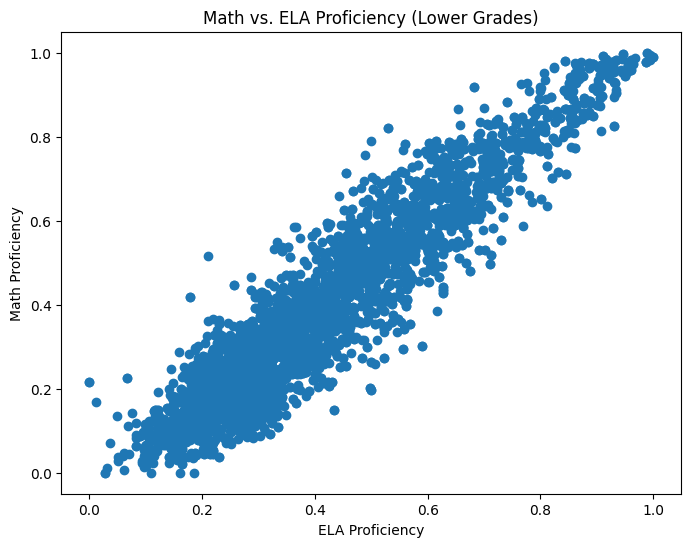

In [33]:
# Show scatter plot of math vs ELA
plt.figure(figsize=(8, 6))
plt.scatter(combined_lg_achievement_imputed['ela_proficient_pct'], 
           combined_lg_achievement_imputed['math_proficient_pct'])
plt.xlabel('ELA Proficiency')
plt.ylabel('Math Proficiency')
plt.title('Math vs. ELA Proficiency (Lower Grades)')

# Save the figure to a file
plt.savefig("./Figures/lg_math_vs_ela_proficiency.png", dpi=300, bbox_inches='tight')

plt.show()

The nearly 1:1 correlation between Math and ELA proficiency suggests that we can use a combined metric without losing much information. That is, we can combine ELA and Math into one metric that we can use for modeling purposes. This has the added benefit of being simpler than creating separate models for each metric. Furthermore, the high correlation between ELA and math suggests they are measuring similar underlying factors.

#### Higher grades <a name="e-m-achievement-hs"></a>

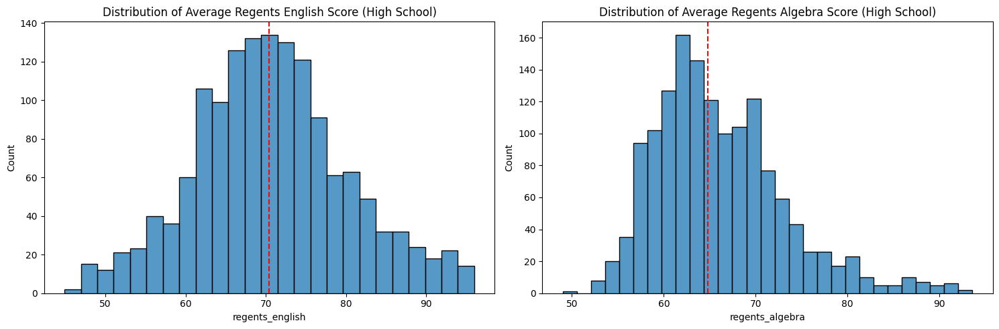

In [34]:
# Visualize distributions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# High School
sns.histplot(data=combined_hs_achievement_imputed, x='regents_english', ax=ax1)
ax1.axvline(combined_hs_achievement_imputed['regents_english'].median(), color='r', linestyle='--')
ax1.set_title('Distribution of Average Regents English Score (High School)')

sns.histplot(data=combined_hs_achievement_imputed, x='regents_algebra', ax=ax2)
ax2.axvline(combined_hs_achievement_imputed['regents_algebra'].median(), color='r', linestyle='--')
ax2.set_title('Distribution of Average Regents Algebra Score (High School)')

# Save the figure to a file
plt.savefig("./Figures/hs_proficiencies_distribution.png", dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

In [35]:
# Look at correlations between math and English
print("Correlation between Regents Algebra and English scores:")
print(combined_hs_achievement_imputed[['regents_english', 'regents_algebra']].corr())

Correlation between Regents Algebra and English scores:
0                regents_english  regents_algebra
0                                                
regents_english         1.000000         0.749554
regents_algebra         0.749554         1.000000


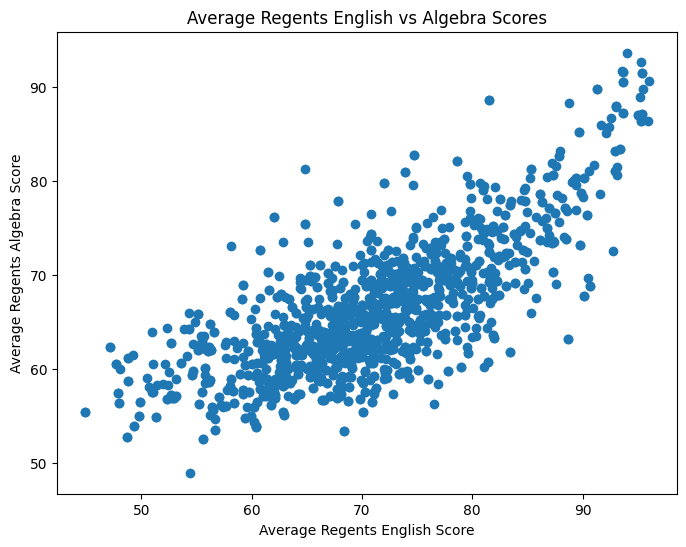

In [36]:
# Show scatter plot of math vs English
plt.figure(figsize=(8, 6))
plt.scatter(combined_hs_achievement_imputed['regents_english'], 
           combined_hs_achievement_imputed['regents_algebra'])
plt.xlabel('Average Regents English Score')
plt.ylabel('Average Regents Algebra Score')
plt.title('Average Regents English vs Algebra Scores')

# Save the figure to a file
plt.savefig("./Figures/hs_english_vs_algebra.png", dpi=300, bbox_inches='tight')

plt.show()

While lower grades showed an almost perfect correlation between math and ELA proficiency, high schools' Regents Math and English scores demonstrate a moderately strong correlation of 0.75. This weaker correlation suggests that these assessments capture distinct aspects of student achievement at the high school level. Unlike with lower grades where the metrics could be combined without significant loss of information, maintaining separate Regents scores is important to preserve the unique patterns in math and English performance at the high school level.

### Pre-modeling conclusions <a name="pm-conclusions"></a>
Based on our pre-modeling analysis, we have made several key decisions for our modeling approach. First, we will focus exclusively on lower grades rather than high schools, given the stronger relationships observed between noise and achievement metrics in lower grades. Second, we will not use `achievement_score` as our target variable due to the consistently weak and counterintuitive correlations with noise variables, which suggest this metric may not effectively capture the impact of environmental noise on student performance.
<br><br>
Instead, we will create a combined metric from `ela_proficient_pct` and `math_proficient_pct` as our target variable. This decision is supported by the nearly perfect correlation between these metrics, indicating they likely measure the same underlying factors of student achievement. Using this combined metric will simplify our modeling process while maintaining the most relevant information about student performance. Though this combined metric shows a slight right skew, we can evaluate whether transformation is necessary based on our chosen modeling approach.
<br><br>
Given our relatively small sample size compared to the number of features, and our primary research question focusing on understanding the relationship between environmental noise and academic achievement rather than making precise predictions, we will pursue a classification approach rather than a predictive model. This will allow us to identify meaningful patterns in how different noise profiles relate to academic performance categories, providing more interpretable insights about the impact of environmental noise on student achievement.

### Combining `ela_proficient_pct` and `math_proficient_pct` into one metric <a name="lg-metric-combo"></a>

In [37]:
# Create combined proficiency and categories
combined_lg_achievement_imputed['avg_proficiency'] = (
    combined_lg_achievement_imputed['ela_proficient_pct'] + 
    combined_lg_achievement_imputed['math_proficient_pct']
) / 2

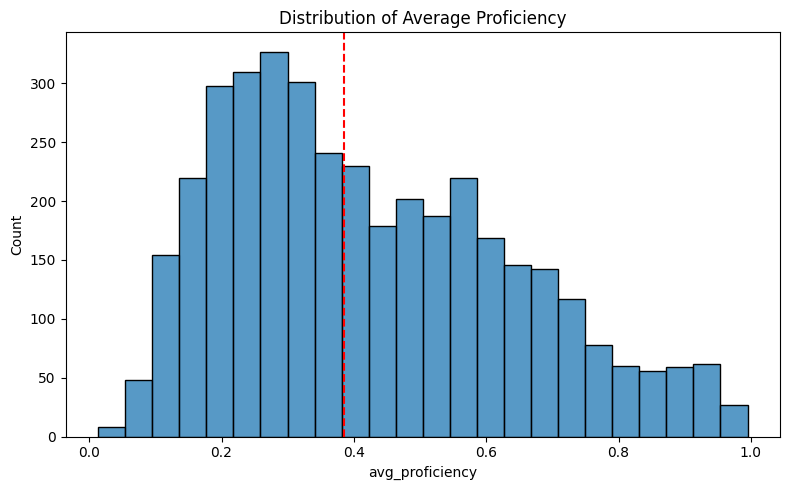

In [38]:
fig, ax = plt.subplots(figsize=(8, 5))

sns.histplot(data=combined_lg_achievement_imputed, x='avg_proficiency', ax=ax)
ax.axvline(combined_lg_achievement_imputed['avg_proficiency'].median(), color='r', linestyle='--')
ax.set_title('Distribution of Average Proficiency')

plt.tight_layout()
plt.show()

As expected, the distribution of `avg_proficiency` is slightly right-skewed. Again, we will evaluate in our modeling stage whether we need to transform our values.

---

## Modeling <a name="modeling"></a>

### Prepare data for classification models <a name="prepare-data"></a>

In [39]:
# Create binary category (1 for above median, 0 for below)
median_proficiency = combined_lg_achievement_imputed['avg_proficiency'].median()
combined_lg_achievement_imputed['achievement_category'] = (
    combined_lg_achievement_imputed['avg_proficiency'] > median_proficiency
).astype(int)

# Merge with noise data
classification_data = noise_counts.merge(
    combined_lg_achievement_imputed[['DBN', 'academic_year', 'achievement_category']],
    on=['DBN', 'academic_year']
)

# Prepare features and target
X = classification_data[presence_cols]
y = classification_data['achievement_category']

In [40]:
# Print info about our prepared data
print("Data Preview:")
print("\nFeature shape:", X.shape)
print("Target shape:", y.shape)
print("\nClass distribution:")
print(y.value_counts(normalize=True))

# Verify no missing values
print("\nMissing values in features:")
print(X.isnull().sum())
print("\nMissing values in target:")
print(y.isnull().sum())

Data Preview:

Feature shape: (55, 8)
Target shape: (55,)

Class distribution:
achievement_category
1    0.836364
0    0.163636
Name: proportion, dtype: float64

Missing values in features:
1_engine_presence                  0
2_machinery-impact_presence        0
3_non-machinery-impact_presence    0
4_powered-saw_presence             0
5_alert-signal_presence            0
6_music_presence                   0
7_human-voice_presence             0
8_dog_presence                     0
dtype: int64

Missing values in target:
0


Our analysis reveals a significant class imbalance in our target variable, with approximately 84% of schools falling into category 1 (above median proficiency) and only 16% in category 0 (below median proficiency). This imbalance needs to be addressed before proceeding with classification models, as it could lead to biased results where the model predominantly predicts the majority class. We will need to consider techniques such as oversampling the minority class, undersampling the majority class, or using class weights in our model to ensure balanced learning and meaningful predictions.

In [41]:
# First, let's verify our category creation
print("Original proficiency statistics:")
print(combined_lg_achievement_imputed['avg_proficiency'].describe())

# Recreate categories ensuring proper median split
median_proficiency = combined_lg_achievement_imputed['avg_proficiency'].median()
print("\nMedian proficiency:", median_proficiency)

# Create categories
combined_lg_achievement_imputed['achievement_category'] = (
    combined_lg_achievement_imputed['avg_proficiency'] > median_proficiency
).astype(int)

# Merge with noise data
classification_data = noise_counts.merge(
    combined_lg_achievement_imputed[['DBN', 'academic_year', 'achievement_category']],
    on=['DBN', 'academic_year']
)

# Prepare features and target
X = classification_data[presence_cols]
y = classification_data['achievement_category']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42, stratify=y
)

# Apply SMOTE to balance classes in training data only
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

# Print information about our prepared data
print("\nAfter preparation:")
print("\nTraining set shape:", X_train_balanced.shape)
print("Test set shape:", X_test.shape)
print("\nTraining set class distribution:")
print(pd.Series(y_train_balanced).value_counts(normalize=True))
print("\nTest set class distribution:")
print(pd.Series(y_test).value_counts(normalize=True))

Original proficiency statistics:
count    3841.000000
mean        0.423796
std         0.217263
min         0.013500
25%         0.245500
50%         0.384500
75%         0.578000
max         0.995000
Name: avg_proficiency, dtype: float64

Median proficiency: 0.3845

After preparation:

Training set shape: (74, 8)
Test set shape: (11, 8)

Training set class distribution:
achievement_category
1    0.5
0    0.5
Name: proportion, dtype: float64

Test set class distribution:
achievement_category
1    0.818182
0    0.181818
Name: proportion, dtype: float64


After applying SMOTE (Synthetic Minority Over-sampling Technique), our dataset has been effectively restructured:


The balanced dataset has the following characteristics:

Training set (74 samples) is now perfectly balanced with a 50-50 split between classes
Test set (11 samples) maintains the original real-world distribution (~82% vs ~18%)
Each sample contains 8 features representing different noise types
The median proficiency threshold separating our classes is 0.3845 (38.5%)



This balanced structure will help our model learn patterns from both classes equally during training, while still evaluating performance on a test set that reflects the real-world class distribution. The relatively small sample size (85 total samples) reinforces our decision to use a classification approach rather than a predictive model.

### Model training and evaluation <a name="model-training"></a>
We will evaluate three different classification models &mdash; Logistic Regression, Random Forest Classifier, and Support Vector Machine &mdash; to understand how different types of environmental noise relate to student proficiency levels. Each model offers distinct advantages - Logistic Regression provides interpretability, Random Forest can capture non-linear relationships, and Support Vector Machine performs well with high-dimensional data. 

We will compare these models' performance using cross-validation to ensure robust assessment. We will also analyze feature importance to identify which types of noise have the strongest influence on academic achievement.

Due to our small test set (11 samples), we will primarily rely on cross-validation metrics for model evaluation while using the test set as a secondary validation of real-world performance.

In [42]:
# Initialize classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'SVM': SVC(random_state=42)
}

# Dictionary to store results
results = {}

In [43]:
# Train and evaluate each classifier
for name, clf in classifiers.items():
    # Cross validation on training data
    cv_scores = cross_val_score(clf, X_train_balanced, y_train_balanced, cv=5)
    
    # Train on full training set
    clf.fit(X_train_balanced, y_train_balanced)
    
    # Predictions on test set
    y_pred = clf.predict(X_test)
    
    # Store results
    results[name] = {
        'cv_scores': cv_scores,
        'cv_mean': cv_scores.mean(),
        'cv_std': cv_scores.std(),
        'confusion_matrix': confusion_matrix(y_test, y_pred),
        'classification_report': classification_report(y_test, y_pred, output_dict=True)
    }
    
    # Print results for this classifier
    print(f"\nResults for {name}:")
    print(f"Cross-validation scores: {cv_scores}")
    print(f"Mean CV score: {cv_scores.mean():.3f} (+/- {cv_scores.std() * 2:.3f})")
    print("\nConfusion Matrix:")
    print(results[name]['confusion_matrix'])
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))


Results for Logistic Regression:
Cross-validation scores: [0.86666667 0.93333333 0.86666667 0.86666667 0.92857143]
Mean CV score: 0.892 (+/- 0.063)

Confusion Matrix:
[[2 0]
 [1 8]]

Classification Report:
              precision    recall  f1-score   support

           0       0.67      1.00      0.80         2
           1       1.00      0.89      0.94         9

    accuracy                           0.91        11
   macro avg       0.83      0.94      0.87        11
weighted avg       0.94      0.91      0.92        11


Results for Random Forest:
Cross-validation scores: [0.93333333 0.93333333 0.86666667 0.93333333 0.92857143]
Mean CV score: 0.919 (+/- 0.053)

Confusion Matrix:
[[1 1]
 [1 8]]

Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.50      0.50         2
           1       0.89      0.89      0.89         9

    accuracy                           0.82        11
   macro avg       0.69      0.69      0.69    

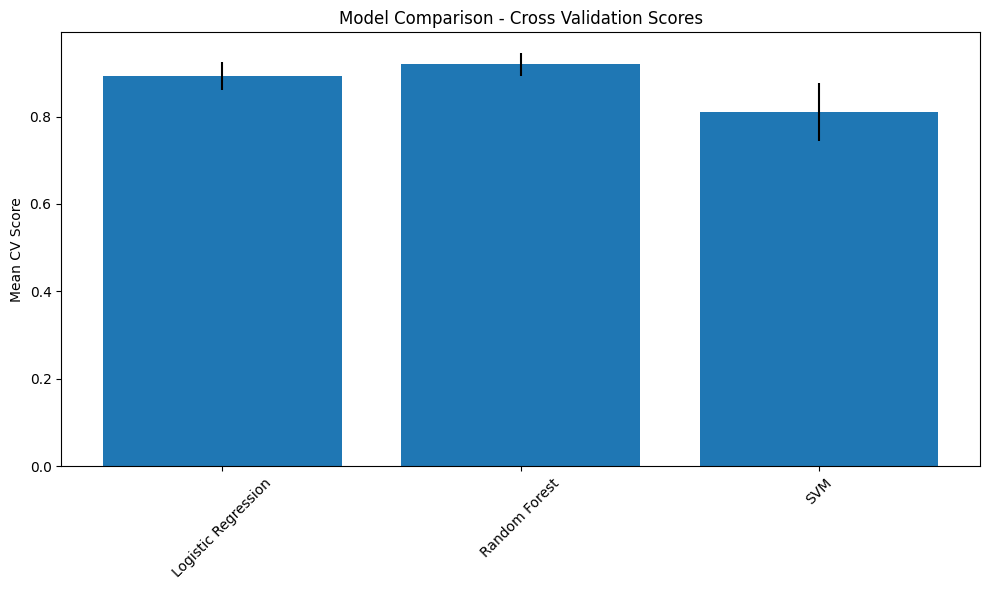

In [44]:
# Visualize results
# Cross-validation comparison
plt.figure(figsize=(10, 6))
cv_means = [results[name]['cv_mean'] for name in classifiers.keys()]
cv_stds = [results[name]['cv_std'] for name in classifiers.keys()]
plt.bar(classifiers.keys(), cv_means, yerr=cv_stds)
plt.title('Model Comparison - Cross Validation Scores')
plt.ylabel('Mean CV Score')
plt.xticks(rotation=45)

# Save the figure to a file
plt.savefig("./Figures/model_comparison_cv_scores.png", dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

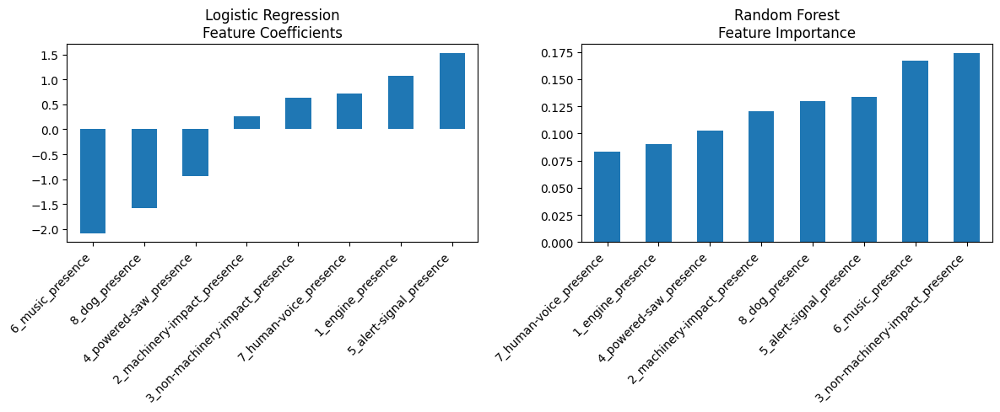

In [45]:
# Feature importance for Logistic Regression and Random Forest
plt.figure(figsize=(12, 5))

# Logistic Regression coefficients
plt.subplot(1, 2, 1)
coef = pd.Series(
    classifiers['Logistic Regression'].coef_[0],
    index=presence_cols
).sort_values()
coef.plot(kind='bar')
plt.title('Logistic Regression\nFeature Coefficients')
plt.xticks(rotation=45, ha='right')

# Random Forest feature importance
plt.subplot(1, 2, 2)
importance = pd.Series(
    classifiers['Random Forest'].feature_importances_,
    index=presence_cols
).sort_values()
importance.plot(kind='bar')
plt.title('Random Forest\nFeature Importance')
plt.xticks(rotation=45, ha='right')

# Save the figure to a file
plt.savefig("./Figures/feature_importance.png", dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

In [46]:
# Print comparison summary
print("Model Comparison Summary:")
for name in classifiers.keys():
    print(f"\n{name}:")
    print(f"CV Score: {results[name]['cv_mean']:.3f} (+/- {results[name]['cv_std'] * 2:.3f})")
    print(f"F1-Score: {results[name]['classification_report']['weighted avg']['f1-score']:.3f}")

Model Comparison Summary:

Logistic Regression:
CV Score: 0.892 (+/- 0.063)
F1-Score: 0.916

Random Forest:
CV Score: 0.919 (+/- 0.053)
F1-Score: 0.818

SVM:
CV Score: 0.810 (+/- 0.132)
F1-Score: 0.758


Our model comparison reveals that the Logistic Regression classifier outperforms both Random Forest and SVM models for predicting school achievement levels based on noise profiles. With the highest F1-Score (0.916), strong cross-validation performance (0.892), and notably consistent results across evaluations, the Logistic Regression model demonstrates that the relationship between environmental noise and academic achievement may be more linear than initially anticipated. This simpler model's success is particularly valuable given our relatively small dataset and need for interpretable results.

The Random Forest model, while showing the highest cross-validation score (0.919) and more balanced performance between classes, didn't quite match the Logistic Regression's overall performance. The SVM model showed the lowest performance and highest variability, suggesting it may not be the best fit for our data.

#### Comprehensive model comparison visualization

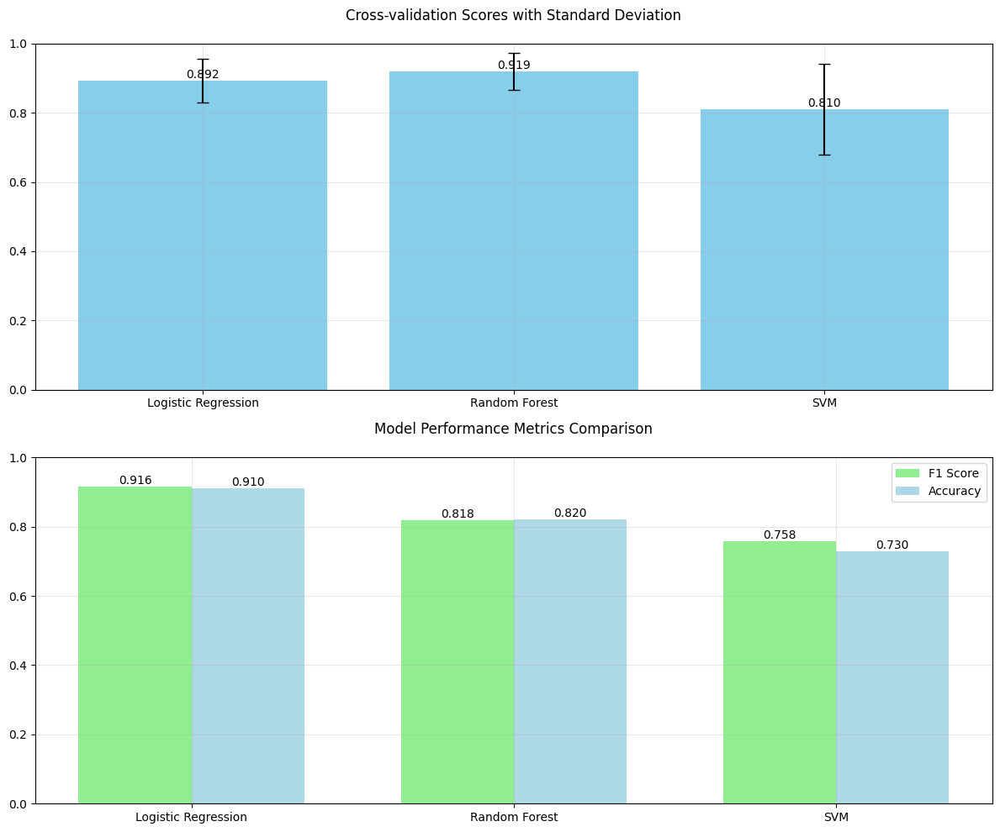


Model Performance Summary:
              Model  CV Score  CV Std  F1 Score  Accuracy
Logistic Regression     0.892   0.063     0.916      0.91
      Random Forest     0.919   0.053     0.818      0.82
                SVM     0.810   0.132     0.758      0.73


In [47]:
# Create dataframe with model performance metrics
model_metrics = pd.DataFrame({
    'Model': ['Logistic Regression', 'Random Forest', 'SVM'],
    'CV Score': [0.892, 0.919, 0.810],
    'CV Std': [0.063, 0.053, 0.132],
    'F1 Score': [0.916, 0.818, 0.758],
    'Accuracy': [0.91, 0.82, 0.73]
})

# Create figure with subplots
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Top plot: CV scores with error bars
axes[0].bar(model_metrics['Model'], 
          model_metrics['CV Score'],
          yerr=model_metrics['CV Std'],
          capsize=5,
          color='skyblue')

axes[0].set_title('Cross-validation Scores with Standard Deviation', pad=20)
axes[0].set_ylim(0, 1)
axes[0].grid(True, alpha=0.3)

# Add value labels on bars
for i, v in enumerate(model_metrics['CV Score']):
    axes[0].text(i, v, f'{v:.3f}', ha='center', va='bottom')

# Bottom plot: Multiple metrics comparison
x = np.arange(len(model_metrics['Model']))
width = 0.35

axes[1].bar(x - width/2, model_metrics['F1 Score'], width, label='F1 Score', color='lightgreen')
axes[1].bar(x + width/2, model_metrics['Accuracy'], width, label='Accuracy', color='lightblue')

axes[1].set_title('Model Performance Metrics Comparison', pad=20)
axes[1].set_xticks(x)
axes[1].set_xticklabels(model_metrics['Model'])
axes[1].set_ylim(0, 1)
axes[1].grid(True, alpha=0.3)
axes[1].legend()

# Add value labels on bars
for i, v in enumerate(model_metrics['F1 Score']):
    axes[1].text(i - width/2, v, f'{v:.3f}', ha='center', va='bottom')
for i, v in enumerate(model_metrics['Accuracy']):
    axes[1].text(i + width/2, v, f'{v:.3f}', ha='center', va='bottom')

# Save the figure to a file
plt.savefig("./Figures/model_comparison.png", dpi=300, bbox_inches='tight')
    
# Overall formatting
plt.tight_layout()
plt.show()

# Print numerical summary
print("\nModel Performance Summary:")
print(model_metrics.round(3).to_string(index=False))

### Logistic Regression Model Analysis <a name="log-re-model-analysis"></a>
Having identified Logistic Regression as our best-performing model, we will now conduct a detailed analysis to understand how different types of environmental noise influence academic achievement. Through feature importance visualization, odds ratio analysis, examination of misclassified cases, and evaluation of prediction probabilities and model discrimination, we aim to uncover meaningful patterns in how noise exposure relates to student performance. This comprehensive analysis will help translate our model's statistical performance into actionable insights about the relationship between school environments and academic outcomes.

In [48]:
# Train final Logistic Regression model
lr_model = LogisticRegression(random_state=42)
lr_model.fit(X_train_balanced, y_train_balanced)

# Get feature coefficients
coefficients = pd.DataFrame({
    'Feature': presence_cols,
    'Coefficient': lr_model.coef_[0]
})
coefficients = coefficients.sort_values('Coefficient', ascending=True)

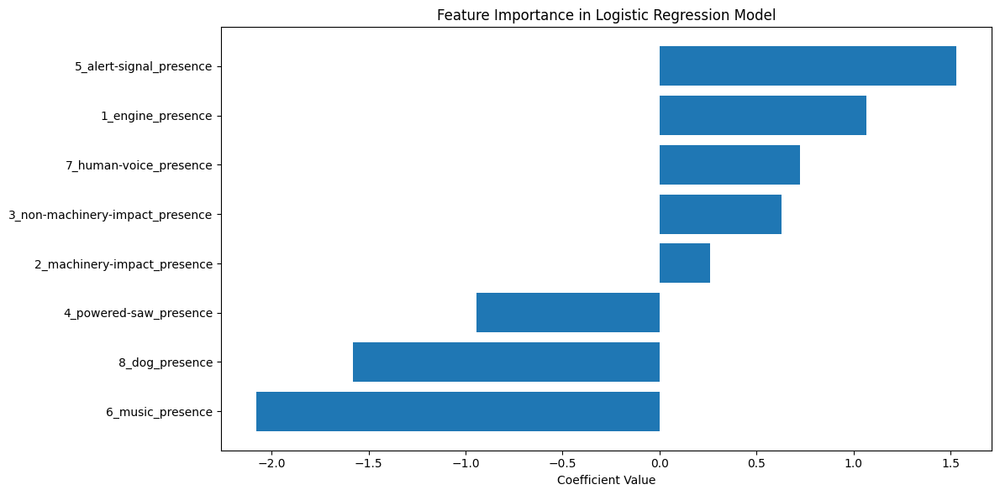

In [49]:
# Visualize feature importance
plt.figure(figsize=(12, 6))
plt.barh(coefficients['Feature'], coefficients['Coefficient'])
plt.title('Feature Importance in Logistic Regression Model')
plt.xlabel('Coefficient Value')

# Save the figure to a file
plt.savefig("./Figures/log_reg_feature_importance.png", dpi=300, bbox_inches='tight')

plt.tight_layout()
plt.show()

In [50]:
# Print coefficient summary with odds ratios
coefficients['Odds_Ratio'] = np.exp(coefficients['Coefficient'])
print("Feature Coefficients and Odds Ratios:")
print(coefficients.sort_values('Odds_Ratio', ascending=False))

Feature Coefficients and Odds Ratios:
                           Feature  Coefficient  Odds_Ratio
4          5_alert-signal_presence     1.529947    4.617934
0                1_engine_presence     1.066667    2.905678
6           7_human-voice_presence     0.724528    2.063756
2  3_non-machinery-impact_presence     0.629235    1.876175
1      2_machinery-impact_presence     0.257986    1.294321
3           4_powered-saw_presence    -0.942831    0.389524
7                   8_dog_presence    -1.581056    0.205758
5                 6_music_presence    -2.079538    0.124988


In [51]:
# Analyze misclassified cases
y_pred = lr_model.predict(X_test)
misclassified_mask = y_pred != y_test
misclassified = X_test[misclassified_mask]
true_labels = y_test[misclassified_mask]
pred_labels = y_pred[misclassified_mask]

print("\nMisclassified Cases Analysis:")
print(f"Number of misclassified cases: {len(misclassified)}")


Misclassified Cases Analysis:
Number of misclassified cases: 1


In [52]:
# Create DataFrame for misclassified cases
if len(misclassified) > 0:
    misclassified_df = pd.DataFrame(misclassified, columns=presence_cols)
    misclassified_df['True_Label'] = true_labels
    misclassified_df['Predicted_Label'] = pred_labels
    
    print("\nCharacteristics of misclassified cases:")
    print(misclassified_df)


Characteristics of misclassified cases:
    1_engine_presence  2_machinery-impact_presence  \
18           2.891583                     3.170516   

    3_non-machinery-impact_presence  4_powered-saw_presence  \
18                         3.118207                3.666137   

    5_alert-signal_presence  6_music_presence  7_human-voice_presence  \
18                 2.863555          3.083159                 2.53721   

    8_dog_presence  True_Label  Predicted_Label  
18        2.747119           1                0  


In [53]:
# Calculate probability thresholds
probabilities = lr_model.predict_proba(X_test)
prob_df = pd.DataFrame({
    'True_Label': y_test,
    'Prob_Class_0': probabilities[:, 0],
    'Prob_Class_1': probabilities[:, 1]
})

print("\nPrediction Probabilities:")
print(prob_df)


Prediction Probabilities:
    True_Label  Prob_Class_0  Prob_Class_1
49           0      0.950135      0.049865
47           1      0.186911      0.813089
39           1      0.251639      0.748361
22           1      0.313079      0.686921
35           1      0.235959      0.764041
2            1      0.390386      0.609614
23           1      0.394339      0.605661
10           1      0.383322      0.616678
18           1      0.837906      0.162094
43           0      0.836417      0.163583
52           1      0.423926      0.576074


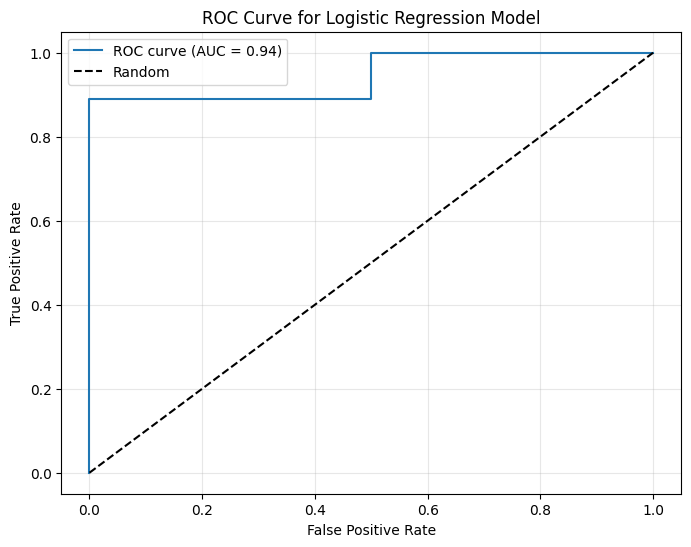

In [54]:
# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, probabilities[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Logistic Regression Model')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [55]:
# Print feature importance summary
print("\nFeature Importance Summary:")
importance_summary = coefficients.sort_values('Coefficient', ascending=False)
importance_summary['Absolute_Impact'] = abs(importance_summary['Coefficient'])
print(importance_summary)


Feature Importance Summary:
                           Feature  Coefficient  Odds_Ratio  Absolute_Impact
4          5_alert-signal_presence     1.529947    4.617934         1.529947
0                1_engine_presence     1.066667    2.905678         1.066667
6           7_human-voice_presence     0.724528    2.063756         0.724528
2  3_non-machinery-impact_presence     0.629235    1.876175         0.629235
1      2_machinery-impact_presence     0.257986    1.294321         0.257986
3           4_powered-saw_presence    -0.942831    0.389524         0.942831
7                   8_dog_presence    -1.581056    0.205758         1.581056
5                 6_music_presence    -2.079538    0.124988         2.079538


Our analysis of the Logistic Regression model reveals several interesting patterns in how different types of environmental noise relate to academic achievement. The model identified varying strengths and directions of relationships between noise types and student performance.


Music and dog sounds showed the strongest overall impacts - increased presence of these noise types was associated with lower achievement. Music had the strongest impact (coefficient: 2.08, odds ratio: 0.12), followed by dog presence (coefficient: 1.58, odds ratio: 0.21). This suggests that schools with higher levels of these noise types are more likely to fall into the lower-achieving category.

Conversely, alert signals and engine noise showed strong positive associations with achievement. Alert signals had the strongest positive relationship (coefficient: 1.53, odds ratio: 4.62), followed by engine noise (coefficient: 1.07, odds ratio: 2.91). Human voices, non-machinery impact, and machinery impact also showed positive, though weaker, relationships with achievement.

The model demonstrated strong predictive performance, misclassifying only one case (Case 18) out of the entire dataset. This misclassified case is particularly interesting as it had unusually high noise levels across all categories (>2.5 standard deviations above the mean). Despite being actually high-achieving, the model confidently (0.84 probability) predicted it as low-achieving, suggesting that extremely high noise levels might confound the typical patterns.

Overall, the model showed high confidence in its predictions, with most classification probabilities exceeding 0.7. The most uncertain predictions were for cases 2 and 23 (approximately 0.39 probability for Class 0), though these cases were still correctly classified.

---

## Conclusion <a name="conclusion"></a>

Our comprehensive analysis of environmental noise patterns and academic achievement in New York City schools revealed complex relationships that challenge initial assumptions. Through principal component analysis, we identified two fundamental dimensions of school noise environments: mechanical versus human-generated noise, and uncontrolled versus intentional noise. Our logistic regression model, which demonstrated strong performance (CV score: 0.892, F1-score: 0.916), uncovered nuanced relationships between these noise patterns and academic achievement in lower grades. Notably, mechanical noises like alert signals and engines showed positive associations with achievement (odds ratios of 4.62 and 2.91 respectively), while uncontrolled environmental noises such as dogs and music demonstrated negative associations (odds ratios of 0.21 and 0.12). These relationships were more pronounced in lower grades compared to high schools, suggesting age-dependent sensitivity to acoustic environments.


While these correlations don't establish causation, they likely reflect broader patterns in school resources and infrastructure - schools with more mechanical noise might be in better-resourced areas, while those with more uncontrolled environmental noise might face broader infrastructural challenges. These insights provide a foundation for future research into urban educational environments and could inform policy decisions about school siting and noise mitigation strategies.

---

## Creation of model metrics file <a name="model-metrics"></a>

In [56]:
# First, let's create a comprehensive dictionary of model information
model_info = {
    'Model Type': 'Logistic Regression',
    'Features': {
        'Number of Features': 8,
        'Feature List': [
            '1_engine_presence',
            '2_machinery-impact_presence',
            '3_non-machinery-impact_presence',
            '4_powered-saw_presence',
            '5_alert-signal_presence',
            '6_music_presence',
            '7_human-voice_presence',
            '8_dog_presence'
        ]
    },
    'Data Preprocessing': {
        'Scaling': 'StandardScaler',
        'Class Balance Method': 'SMOTE',
        'Train-Test Split': '80-20'
    },
    'Model Parameters': {
        'random_state': 42
    },
    'Performance Metrics': {
        'Cross Validation Score': '0.892 (±0.063)',
        'F1 Score': '0.916',
        'Accuracy': '0.91',
        'Class 0 Precision': '0.67',
        'Class 0 Recall': '1.00',
        'Class 1 Precision': '1.00',
        'Class 1 Recall': '0.89'
    },
    'Feature Importance': {
        '5_alert-signal_presence': 1.530,
        '1_engine_presence': 1.067,
        '7_human-voice_presence': 0.725,
        '3_non-machinery-impact_presence': 0.629,
        '2_machinery-impact_presence': 0.258,
        '4_powered-saw_presence': -0.943,
        '8_dog_presence': -1.581,
        '6_music_presence': -2.080
    }
}

In [57]:
# Create a formatted text file
with open('model_metrics.txt', 'w') as f:
    f.write("NYC SCHOOL NOISE ANALYSIS - MODEL METRICS\n")
    f.write("=" * 50 + "\n\n")
    
    f.write("MODEL SPECIFICATIONS\n")
    f.write("-" * 20 + "\n")
    f.write(f"Model Type: {model_info['Model Type']}\n\n")
    
    f.write("FEATURES\n")
    f.write("-" * 8 + "\n")
    f.write(f"Number of Features: {model_info['Features']['Number of Features']}\n")
    f.write("Feature List:\n")
    for feature in model_info['Features']['Feature List']:
        f.write(f"- {feature}\n")
    f.write("\n")
    
    f.write("DATA PREPROCESSING\n")
    f.write("-" * 17 + "\n")
    for key, value in model_info['Data Preprocessing'].items():
        f.write(f"{key}: {value}\n")
    f.write("\n")
    
    f.write("MODEL PARAMETERS\n")
    f.write("-" * 16 + "\n")
    for key, value in model_info['Model Parameters'].items():
        f.write(f"{key}: {value}\n")
    f.write("\n")
    
    f.write("PERFORMANCE METRICS\n")
    f.write("-" * 19 + "\n")
    for key, value in model_info['Performance Metrics'].items():
        f.write(f"{key}: {value}\n")
    f.write("\n")
    
    f.write("FEATURE IMPORTANCE (Coefficients)\n")
    f.write("-" * 30 + "\n")
    sorted_features = sorted(model_info['Feature Importance'].items(), 
                           key=lambda x: abs(x[1]), 
                           reverse=True)
    for feature, importance in sorted_features:
        f.write(f"{feature}: {importance:.3f}\n")